# Semantic Segmentation Demo

This is a notebook for running the benchmark semantic segmentation network from the the [ADE20K MIT Scene Parsing Benchchmark](http://sceneparsing.csail.mit.edu/).

The code for this notebook is available here
https://github.com/CSAILVision/semantic-segmentation-pytorch/tree/master/notebooks

It can be run on Colab at this URL https://colab.research.google.com/github/CSAILVision/semantic-segmentation-pytorch/blob/master/notebooks/DemoSegmenter.ipynb

### Environment Setup

First, download the code and pretrained models if we are on colab.

In [ ]:
%%bash
# Colab-specific setup
!(stat -t /usr/local/lib/*/dist-packages/google/colab > /dev/null 2>&1) && exit
pip install yacs 2>&1 >> install.log
git init 2>&1 >> install.log
git remote add origin https://github.com/CSAILVision/semantic-segmentation-pytorch.git 2>> install.log
git pull origin master 2>&1 >> install.log
DOWNLOAD_ONLY=1 ./demo_test.sh 2>> install.log

hint: Using 'master' as the name for the initial branch. This default branch name
hint: is subject to change. To configure the initial branch name to use in all
hint: of your new repositories, which will suppress this warning, call:
hint: 
hint: 	git config --global init.defaultBranch <name>
hint: 
hint: Names commonly chosen instead of 'master' are 'main', 'trunk' and
hint: 'development'. The just-created branch can be renamed via this command:
hint: 
hint: 	git branch -m <name>
From https://github.com/CSAILVision/semantic-segmentation-pytorch
 * branch            master     -> FETCH_HEAD
 * [new branch]      master     -> origin/master


## Imports and utility functions

We need pytorch, numpy, and the code for the segmentation model.  And some utilities for visualizing the data.

In [ ]:
# System libs
import os, csv, torch, numpy, scipy.io, PIL.Image, torchvision.transforms
# Our libs
from mit_semseg.models import ModelBuilder, SegmentationModule
from mit_semseg.utils import colorEncode

colors = scipy.io.loadmat('data/color150.mat')['colors']
names = {}
with open('data/object150_info.csv') as f:
    reader = csv.reader(f)
    next(reader)
    for row in reader:
        names[int(row[0])] = row[5].split(";")[0]

def visualize_result(img, pred, index=None):
    # filter prediction class if requested
    if index is not None:
        pred = pred.copy()
        pred[pred != index] = -1
        print(f'{names[index+1]}:')

    # colorize prediction
    pred_color = colorEncode(pred, colors).astype(numpy.uint8)

    # aggregate images and save
    im_vis = numpy.concatenate((img, pred_color), axis=1)
    display(PIL.Image.fromarray(im_vis))

## Loading the segmentation model

Here we load a pretrained segmentation model.  Like any pytorch model, we can call it like a function, or examine the parameters in all the layers.

After loading, we put it on the GPU.  And since we are doing inference, not training, we put the model in eval mode.

In [ ]:
import torch
import torch.nn as nn

class CustomEncoder(nn.Module):
    def __init__(self):
        super(CustomEncoder, self).__init__()
        # Define your custom encoder architecture
        self.conv1 = nn.Conv2d(3, 64, kernel_size=(3, 3), stride=1, padding=1)
        self.conv2 = nn.Conv2d(64, 128, kernel_size=(3, 3), stride=1, padding=1)
        self.conv3 = nn.Conv2d(128, 256, kernel_size=(3, 3), stride=1, padding=1)
        # Add more convolutional layers as needed

    def forward(self, x, return_feature_maps=False):
        # Implement the forward pass of the encoder
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        # Apply activation functions, pooling, etc. as needed

        if return_feature_maps:
            return x

        return x


class CustomDecoder(nn.Module):
    def __init__(self, num_classes):
        super(CustomDecoder, self).__init__()
        # Define your custom decoder architecture
        self.conv1 = nn.Conv2d(256, 128, kernel_size=(3, 3), stride=1, padding=1)
        self.conv2 = nn.Conv2d(128, 64, kernel_size=(3, 3), stride=1, padding=1)
        self.conv3 = nn.Conv2d(64, 32, kernel_size=(3, 3), stride=1, padding=1)
        self.final_conv = nn.Conv2d(32, num_classes, kernel_size=(3, 3), stride=1, padding=1)
        # Add more convolutional layers as needed

    def forward(self, x, segSize=None):
        # Implement the forward pass of the decoder
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.final_conv(x)
        # Apply activation functions, upsampling, etc. as needed


        return x

# Create an instance of the custom encoder and decoder
custom_encoder = CustomEncoder()
custom_decoder = CustomDecoder(num_classes=150)

# Initialize the segmentation module with the custom encoder and decoder
crit = torch.nn.NLLLoss(ignore_index=-1)
segmentation_module = SegmentationModule(custom_encoder, custom_decoder, crit)
segmentation_module.eval()
segmentation_module.cuda()

In [ ]:
optimizer = torch.optim.Adam(segmentation_module.parameters(), lr=1e-3)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)

# Define the number of training epochs
num_epochs = 50

# Training loop
for epoch in range(num_epochs):
    # Set the model to train mode
    segmentation_module.train()

    # Iterate over the training dataset
    for batch_idx, (images, masks) in enumerate(train_dataloader):
        # Move the images and masks to the GPU if available
        images = images.cuda()
        masks = masks.cuda()

        # Clear the gradients
        optimizer.zero_grad()

        # Forward pass
        outputs = segmentation_module(images)

        # Calculate the loss
        loss = criterion(outputs, masks)

        # Backpropagation
        loss.backward()
        optimizer.step()

        # Print training progress
        if batch_idx % 10 == 0:
            print('Epoch [{}/{}], Step [{}/{}], Loss: {:.4f}'
                  .format(epoch+1, num_epochs, batch_idx+1, len(train_dataloader), loss.item()))

    # Adjust the learning rate
    scheduler.step()

    # Evaluation
    if (epoch+1) % 5 == 0:
        # Set the model to evaluation mode
        segmentation_module.eval()

        # Calculate evaluation metrics on the validation dataset
        with torch.no_grad():
            total_iou = 0
            total_pixel_accuracy = 0
            num_batches = 0

            for val_images, val_masks in val_dataloader:
                val_images = val_images.cuda()
                val_masks = val_masks.cuda()

                val_outputs = segmentation_module(val_images)
                val_pred = torch.argmax(val_outputs, dim=1)

                iou = calculate_iou(val_pred, val_masks)
                pixel_accuracy = calculate_pixel_accuracy(val_pred, val_masks)

                total_iou += iou
                total_pixel_accuracy += pixel_accuracy
                num_batches += 1

            avg_iou = total_iou / num_batches
            avg_pixel_accuracy = total_pixel_accuracy / num_batches

            print('Epoch [{}/{}], Validation IoU: {:.4f}, Validation Pixel Accuracy: {:.4f}'
                  .format(epoch+1, num_epochs, avg_iou, avg_pixel_accuracy))

# Save the trained model
torch.save(segmentation_module.state_dict(), 'trained_model.pth')

In [ ]:
# Network Builders
net_encoder = ModelBuilder.build_encoder(
    arch='resnet50dilated',
    fc_dim=2048,
    weights='ckpt/ade20k-resnet50dilated-ppm_deepsup/encoder_epoch_20.pth')
net_decoder = ModelBuilder.build_decoder(
    arch='ppm_deepsup',
    fc_dim=2048,
    num_class=150,
    weights='ckpt/ade20k-resnet50dilated-ppm_deepsup/decoder_epoch_20.pth',
    use_softmax=True)

crit = torch.nn.NLLLoss(ignore_index=-1)
segmentation_module = SegmentationModule(net_encoder, net_decoder, crit)
segmentation_module.eval()
segmentation_module.cuda()

Loading weights for net_encoder
Loading weights for net_decoder


SegmentationModule(
  (encoder): ResnetDilated(
    (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn1): SynchronizedBatchNorm2d(64, eps=1e-05, momentum=0.001, affine=True, track_running_stats=True)
    (relu1): ReLU(inplace=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): SynchronizedBatchNorm2d(64, eps=1e-05, momentum=0.001, affine=True, track_running_stats=True)
    (relu2): ReLU(inplace=True)
    (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn3): SynchronizedBatchNorm2d(128, eps=1e-05, momentum=0.001, affine=True, track_running_stats=True)
    (relu3): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(128, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): SynchronizedBatchNorm2d(64, eps=1

## Load test data

Now we load and normalize a single test image.  Here we use the commonplace convention of normalizing the image to a scale for which the RGB values of a large photo dataset would have zero mean and unit standard deviation.  (These numbers come from the imagenet dataset.)  With this normalization, the limiiting ranges of RGB values are within about (-2.2 to +2.7).

In [ ]:
# Load and normalize one image as a singleton tensor batch
pil_to_tensor = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(
        mean=[0.485, 0.456, 0.406], # These are RGB mean+std values
        std=[0.229, 0.224, 0.225])  # across a large photo dataset.
])
pil_image = PIL.Image.open('ADE_val_00001519.jpg').convert('RGB')
img_original = numpy.array(pil_image)
img_data = pil_to_tensor(pil_image)
singleton_batch = {'img_data': img_data[None].cuda()}
output_size = img_data.shape[1:]

## Run the Model

Finally we just pass the test image to the segmentation model.

The segmentation model is coded as a function that takes a dictionary as input, because it wants to know both the input batch image data as well as the desired output segmentation resolution.  We ask for full resolution output.

Then we use the previously-defined visualize_result function to render the segmentation map.

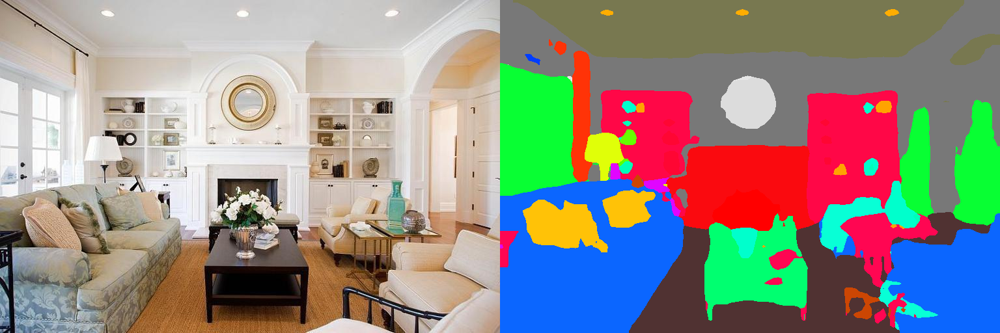

In [ ]:
# Run the segmentation at the highest resolution.
with torch.no_grad():
    scores = segmentation_module(singleton_batch, segSize=output_size)

# Get the predicted scores for each pixel
_, pred = torch.max(scores, dim=1)
pred = pred.cpu()[0].numpy()
visualize_result(img_original, pred)

## Showing classes individually

To see which colors are which, here we visualize individual classes, one at a time.

wall:


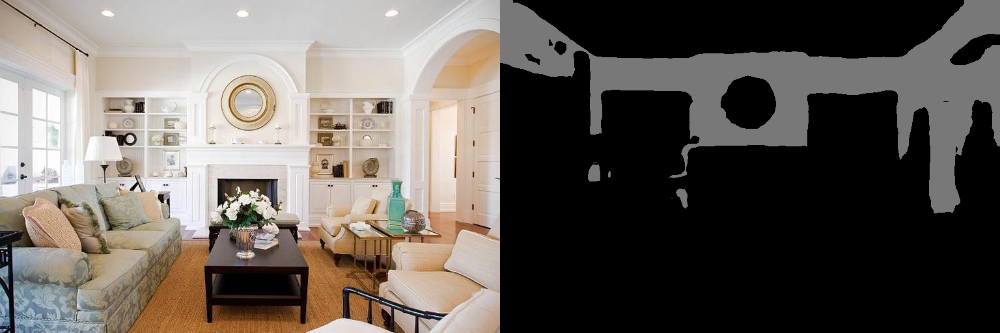

sofa:


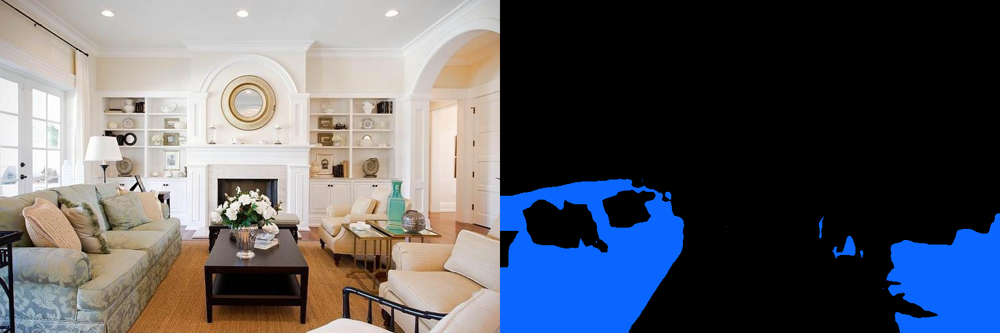

ceiling:


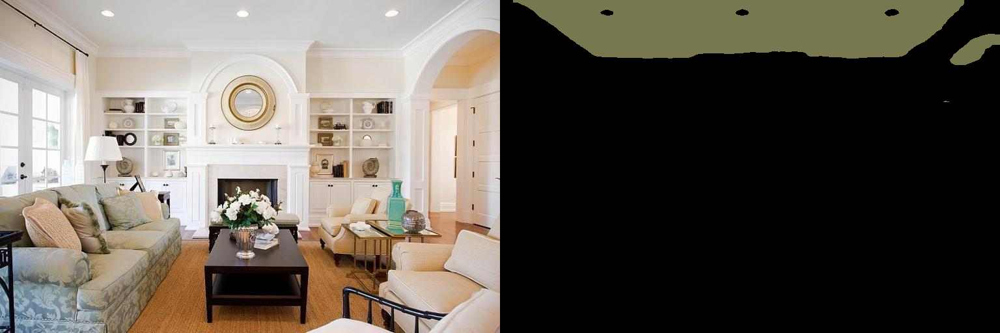

door:


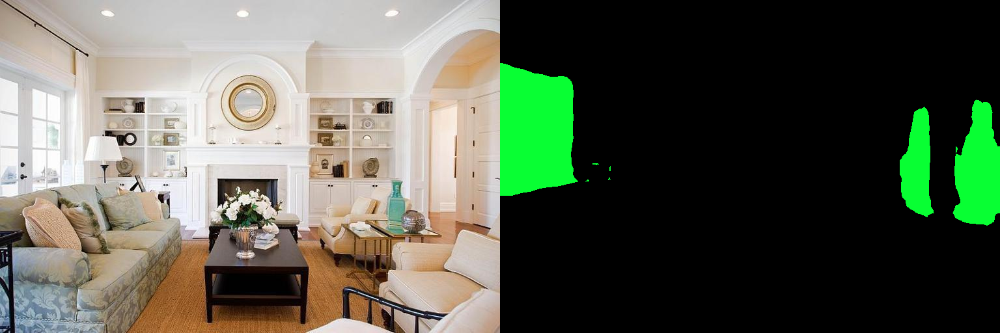

shelf:


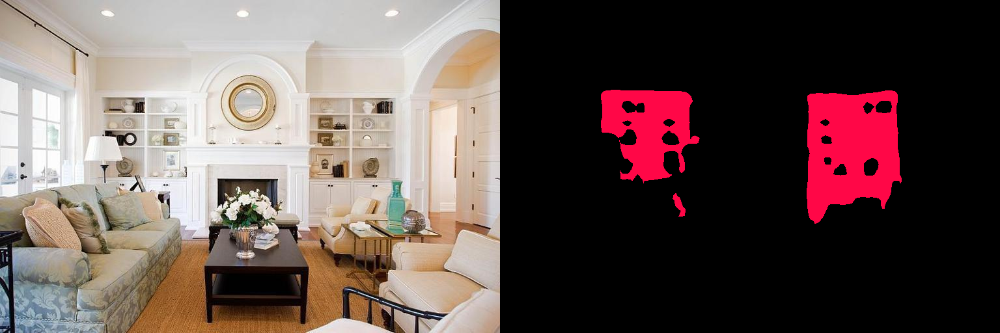

floor:


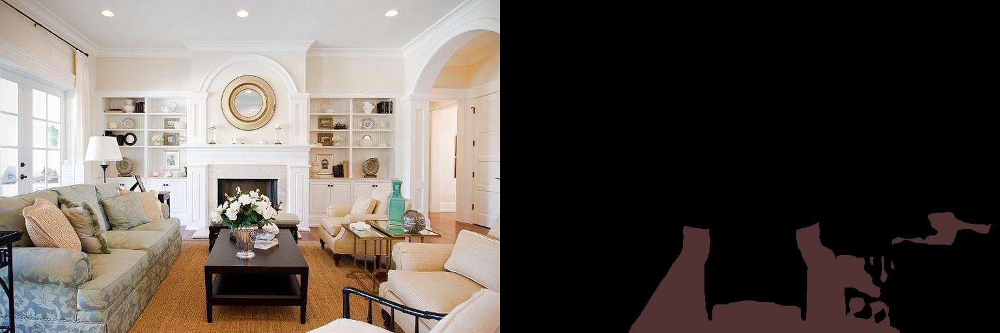

fireplace:


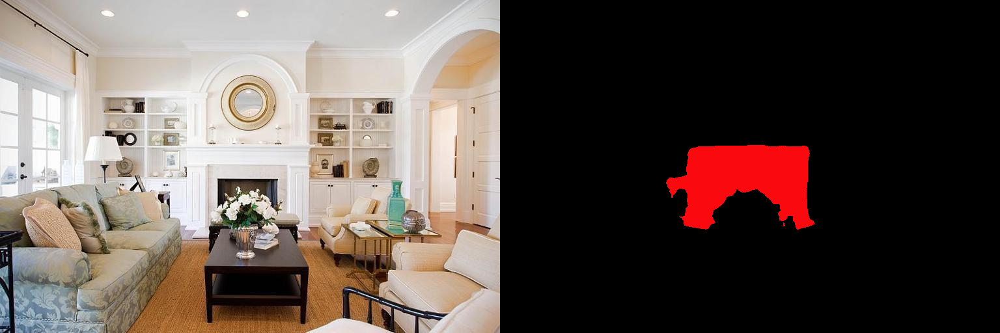

coffee:


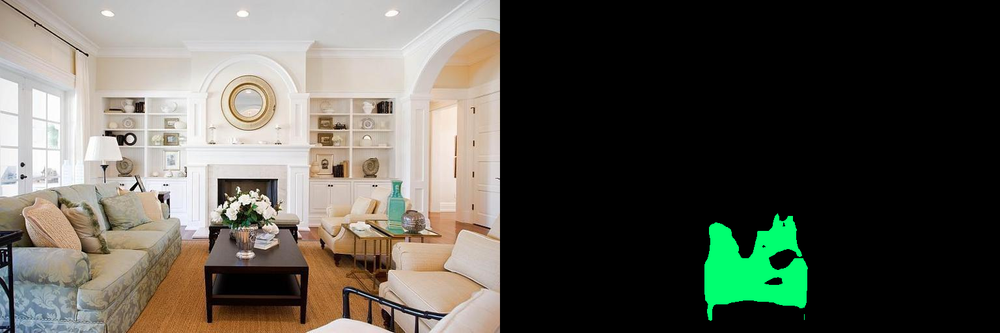

cushion:


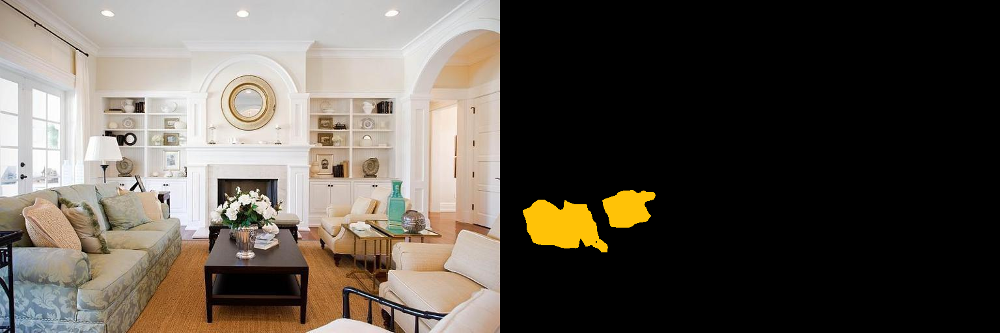

table:


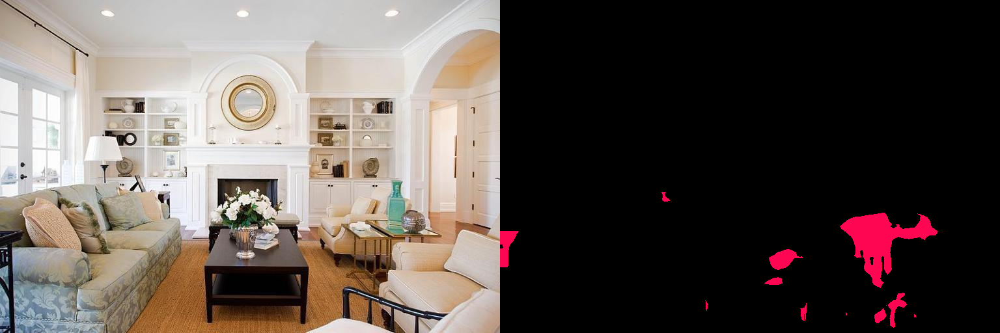

armchair:


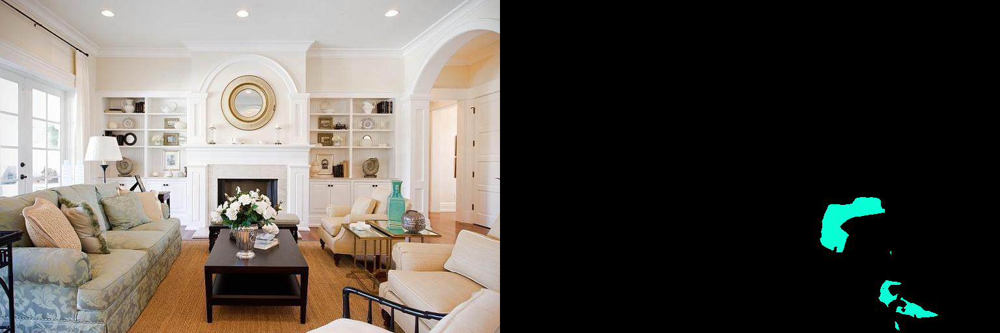

curtain:


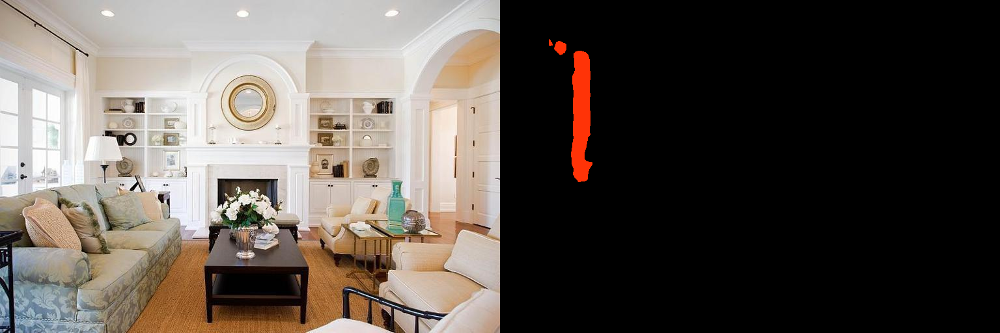

mirror:


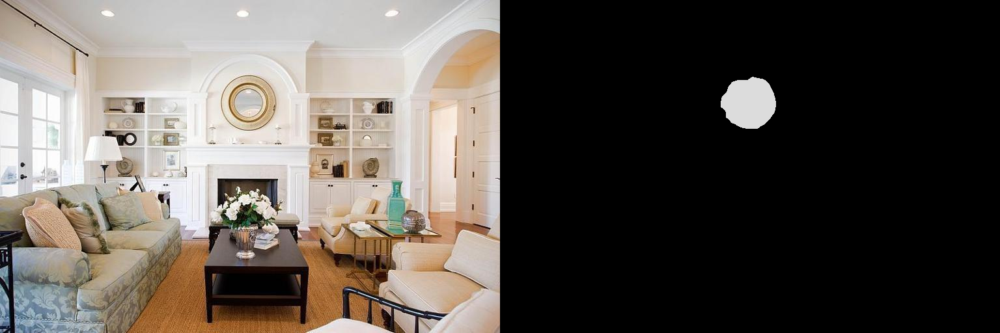

flower:


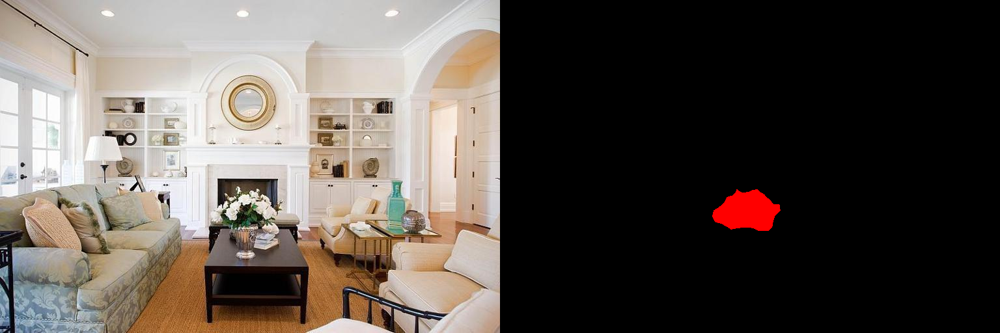

vase:


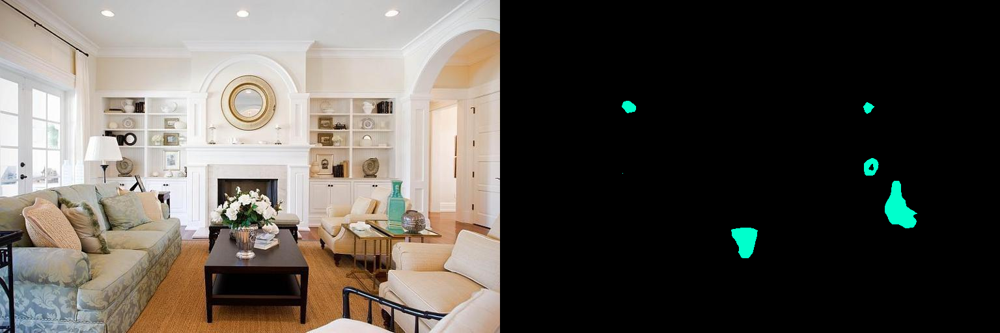

In [ ]:
# Top classes in answer
predicted_classes = numpy.bincount(pred.flatten()).argsort()[::-1]
for c in predicted_classes[:15]:
    visualize_result(img_original, pred, c)

In [ ]:
predicted_classes[:15]

array([  0,  23,   5,  14,  24,   3,  49,  64,  39,  15,  30,  18,  27,
        66, 135])

In [ ]:
import numpy as np
import PIL.Image
from IPython.display import display

In [ ]:
def show_result(img, pred, index=None):
    # filter prediction class if requested
    if index is not None:
        pred = pred.copy()
        pred[pred != index] = -1
        print(f'{names[index+1]}:')

    # colorize prediction
    pred_color = colorEncode(pred, colors).astype(numpy.uint8)

    # display the predicted color image
    display(PIL.Image.fromarray(pred_color))

    # return the pred_color array
    return pred_color


sofa:


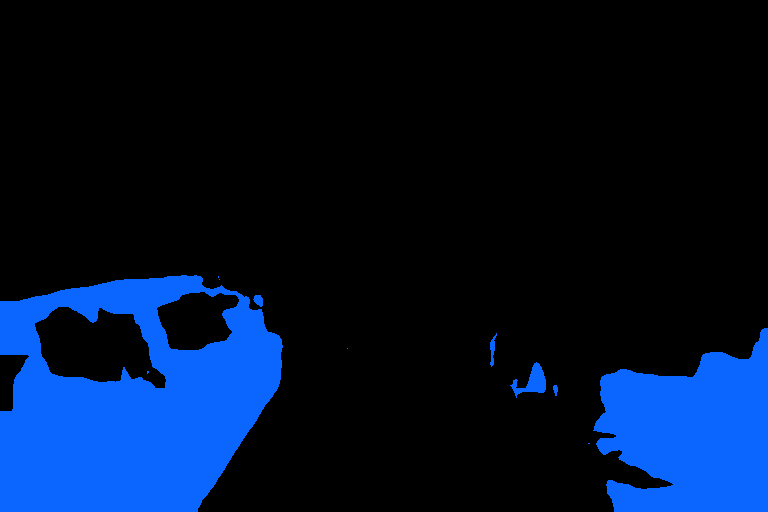

In [ ]:
segmented_image = show_result(img_original, pred, 23)

In [ ]:
import os
import tensorflow as tf
# Load compressed models from tensorflow_hub
os.environ['TFHUB_MODEL_LOAD_FORMAT'] = 'COMPRESSED'

In [ ]:
import IPython.display as display

import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (12, 12)
mpl.rcParams['axes.grid'] = False

import numpy as np
import PIL.Image
import time
import functools

In [ ]:
def tensor_to_image(tensor):
  tensor = tensor*255
  tensor = np.array(tensor, dtype=np.uint8)
  if np.ndim(tensor)>3:
    assert tensor.shape[0] == 1
    tensor = tensor[0]
  return PIL.Image.fromarray(tensor)

In [ ]:
content_path = tf.keras.utils.get_file('YellowLabradorLooking_new.jpg', 'https://storage.googleapis.com/download.tensorflow.org/example_images/YellowLabradorLooking_new.jpg')
style_path = tf.keras.utils.get_file('kandinsky5.jpg','https://storage.googleapis.com/download.tensorflow.org/example_images/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg')

195196/195196 [==============================] - 0s 1us/step


In [ ]:
def load_img(path_to_img):
  max_dim = segmented_image.shape[1]
  img = tf.io.read_file(path_to_img)
  img = tf.image.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)

  shape = tf.cast(tf.shape(img)[:-1], tf.float32)
  long_dim = max(shape)
  scale = max_dim / long_dim

  new_shape = tf.cast(shape * scale, tf.int32)

  img = tf.image.resize(img, new_shape)
  img = img[tf.newaxis, :]
  return img

In [ ]:
segmented_image.shape[1]

768

In [ ]:
def imshow(image, title=None):
  if len(image.shape) > 3:
    image = tf.squeeze(image, axis=0)

  plt.imshow(image)
  if title:
    plt.title(title)

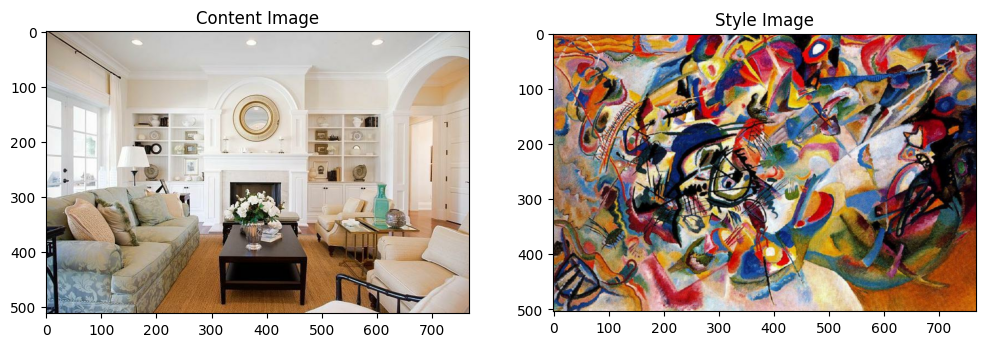

In [ ]:
content_image = load_img('ADE_val_00001519.jpg')
style_image = load_img(style_path)

plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

In [ ]:
import tensorflow_hub as hub
hub_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')
stylized_image = hub_model(tf.constant(content_image), tf.constant(style_image))[0]
style_image = tensor_to_image(stylized_image)

In [ ]:
segmented_image.shape

(512, 768, 3)

In [ ]:
resized_content_image.shape

(344, 512, 3)

In [ ]:
content_image.shape

TensorShape([1, 512, 768, 3])

In [ ]:
style_image.shape

TensorShape([1, 672, 1024, 3])

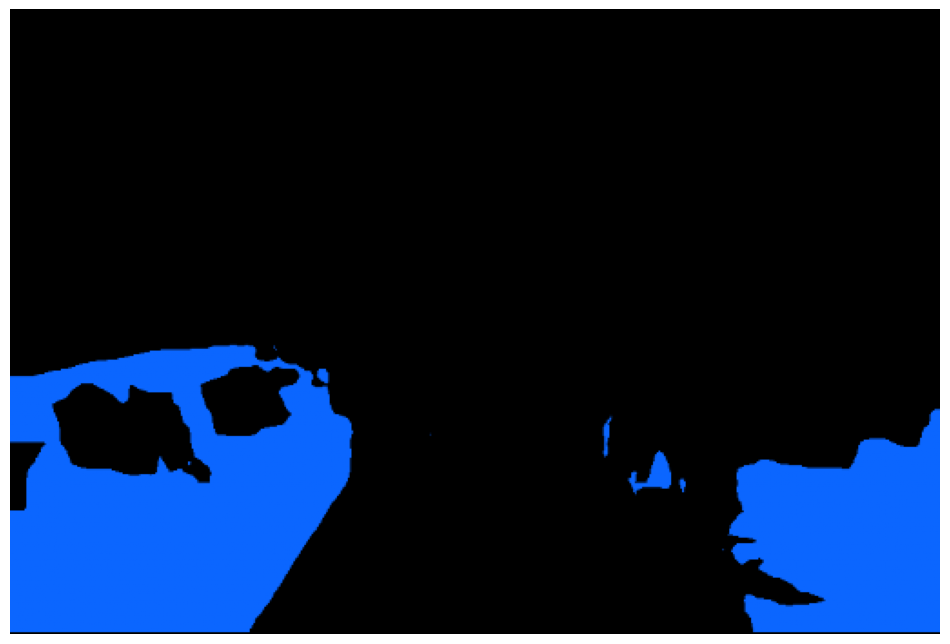

In [ ]:
desired_width = 512
desired_height = 344

# Resize the segmented_image using scipy.ndimage.zoom
resized_segmented_image = scipy.ndimage.zoom(segmented_image, (desired_height / segmented_image.shape[0], desired_width / segmented_image.shape[1], 1), order=1)

# Display the resized segmented_image
plt.imshow(resized_segmented_image)
plt.axis('off')
plt.show()

In [ ]:
desired_width = content_image.shape[1]
desired_height =
resized_style_image = scipy.ndimage.zoom(content_image, (desired_height / content_image.shape[0], desired_width / content_image.shape[1], 1), order=1)

In [ ]:
# Remove the batch dimension if present
content_image = content_image.squeeze(axis=0)

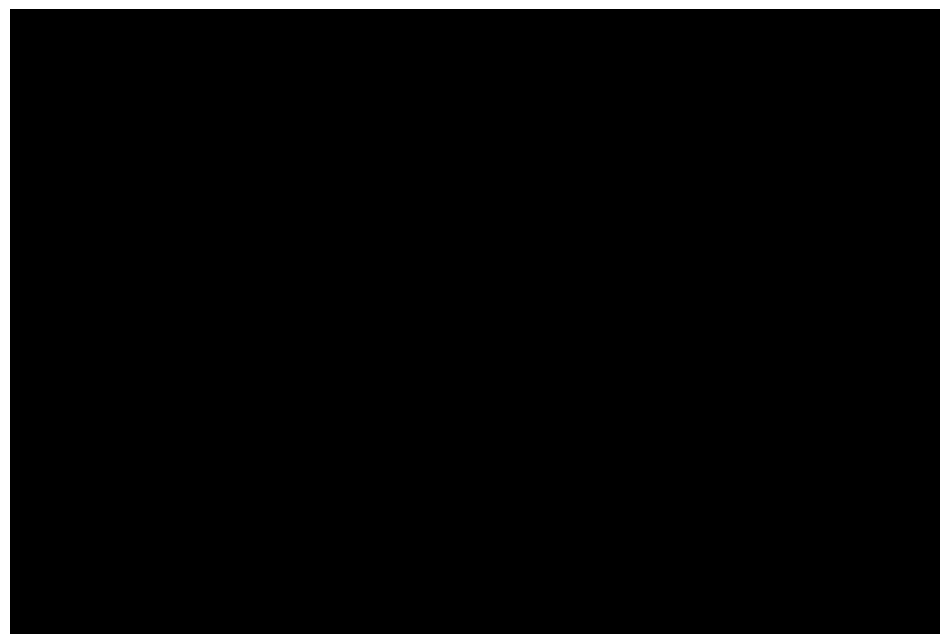

In [ ]:
from PIL import Image

# Convert the images to numpy arrays
content_image = np.array(resized_content_image)
style_image = np.array(style_image)
segmented_image = np.array(resized_segmented_image)

# Convert the images to float values in the range of 0-1
content_image = content_image / 255.0
style_image = style_image / 255.0
segmented_image = segmented_image / 255.0

# Extract the RGB channels of the segmented image
r_channel = segmented_image[:, :, 0]
g_channel = segmented_image[:, :, 1]
b_channel = segmented_image[:, :, 2]

# Create a mask for the black parts of the segmented image
black_mask = np.logical_and(r_channel == 0, np.logical_and(g_channel == 0, b_channel == 0))

# Create a mask for the non-black parts of the segmented image
non_black_mask = np.logical_not(black_mask)

# Create a copy of the segmented image to store the final result
filled_image = np.copy(segmented_image)

# Fill the black parts with the corresponding colors from the content image
filled_image[black_mask] = content_image[black_mask]

# Fill the non-black parts with the colors from the style image
filled_image[non_black_mask] = style_image[non_black_mask]

# Display the filled image
plt.imshow(filled_image)
plt.axis('off')
plt.show()